In [1]:
import altair as alt
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import pandas as pd
import numpy as np
from HW2 import get_cali_data, get_bay_data, get_la_data, plot_by_hour

%matplotlib inline
plt.rc('image', origin='lower')
plt.rc('figure', figsize=(10, 6))
font = {'size'   : 20}

plt.rc('font', size=20)

# A2: Marine Vessel Behavior Along the California Coast Using AIS Data


### Background
The automatic identification system (AIS) provides the position, course, and speed of watercraft and vessels at sea. Vessels with AIS transceivers broadcast this data, which can be used by other vessels, AIS base stations, and even satellites to provide maritime situational awareness to crews and vessel traffic services. The US Department of the Interior publishes this data publically, and I'll be using it to investigate the behaviors of marine vessels for assignment A2. Specifically, I'll be focusing on the behavior and movement patterns of ships close to San Francisco and Los Angeles.


### Data
Data is made public at https://marinecadastre.gov/ais/ with each file corresponding to one day's worth of data. Since this is a lot of data, I'll be selecting only one day, and filtering down to vessels specifically off the coast of the SF bay area and off the coast of LA. For some exploration, I'll be looking at vessel types, the statuses of vessels, their position and movement (e.g. (lat, lon) and (heading, speed)), etc.

A data dictionary is copied below:
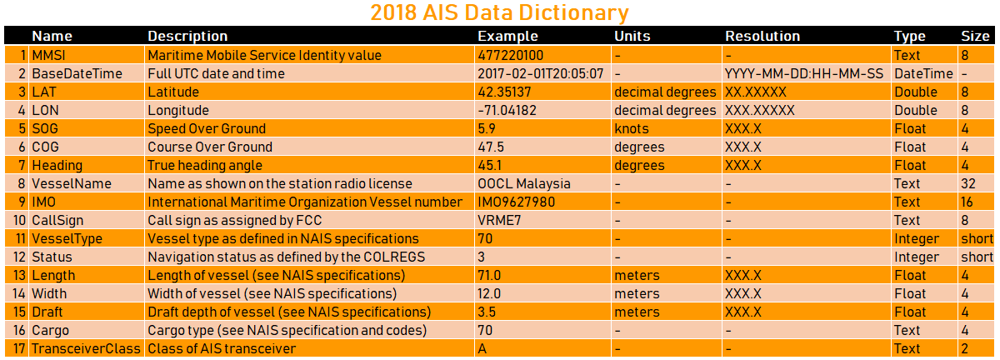
source: https://coast.noaa.gov/data/marinecadastre/ais/2018DataDictionary.png

## Initial Exploration and Data Wrangling

To get a manageable amount of data, we will be sticking to two regions off the coast of california: the "Bay Area", which is bounded by (37.5523, -123) and (38.10289, -122.12904), and "LA", which will is bounded by (33.3743, -119.1863) and (34, -117.5993). We also only look at vessels with > 100 AIS records. Vessels transmit one record/minute while moving and one record/three minutes when moored or at anchor, so these vessel will be active for a significant length of time.

I'll also be replacing some of the nominal variables with more descriptive fields (e.g. for VesselType 70:cargo, 80: Tanker, etc). Descriptions of the raw data fields can be found here: https://www.navcen.uscg.gov/pdf/AIS/AISGuide.pdf

In [2]:
# cali_data = get_cali_data('AIS_2020_06_11.csv')
# bay_data = get_bay_data(cali_data)
# la_data = get_la_data(cali_data)

bay_data = pd.read_csv('bay.csv')
la_data = pd.read_csv('LA.csv')
bay_data['BaseDateTime'] = pd.to_datetime(bay_data['BaseDateTime'])
la_data['BaseDateTime'] = pd.to_datetime(la_data['BaseDateTime'])

In [3]:
data = pd.concat([bay_data, la_data])
data.head()

,MMSI,BaseDateTime,LAT,LON,SOG,COG,Heading,VesselName,IMO,CallSign,VesselType,Status,Length,Width,Draft,Cargo,TranscieverClass,Region
0,211335760,2020-06-11 00:00:32,37.81724,-122.43954,6.7,90.4,93.0,ROTTERDAM EXPRESS,IMO9193317,DMRX,Cargo,Under way using engine,293.0,32.0,13.6,NaN,B,Bay Area
1,211335760,2020-06-11 00:01:42,37.81724,-122.43693,6.3,89.2,92.0,ROTTERDAM EXPRESS,IMO9193317,DMRX,Cargo,Under way using engine,293.0,32.0,13.6,NaN,B,Bay Area
2,211335760,2020-06-11 00:02:51,37.81727,-122.43451,5.9,90.0,93.0,ROTTERDAM EXPRESS,IMO9193317,DMRX,Cargo,Under way using engine,293.0,32.0,13.6,NaN,B,Bay Area
3,211335760,2020-06-11 00:04:01,37.81724,-122.43221,5.5,90.9,93.0,ROTTERDAM EXPRESS,IMO9193317,DMRX,Cargo,Under way using engine,293.0,32.0,13.6,NaN,B,Bay Area
4,211335760,2020-06-11 00:05:12,37.81718,-122.43002,5.2,93.0,93.0,ROTTERDAM EXPRESS,IMO9193317,DMRX,Cargo,Under way using engine,293.0,32.0,13.6,NaN,B,Bay Area


the dataset above contains one row for each AIS transmission. Again, vessels that are moving transmit once per minute, while vessels at anchor or moored transmit once every 3 minutes.

Important data fields I'll be exploring are:
* **LAT** and **LON**: the lattitude and longitude of the vessel
* **BaseDateTime**: Time of AIS transmission (in UTC)
* **Heading**: the directionn the vessel is physically pointed
* **COG**: the course over ground, the actual direction the vessel traveled
* **SOG**: the speed over ground, how fast the ship is moving in knots
* **VesselType**: options are Tug, Cargo, Tanker, Pleasure Craft, and Passenger
* **Status**: options are Under way using engine, Moored, At anchor, Fishing, Under way sailing, and Restricted manoeuverability
* **Length** and **Width**: Dimensions of the vessel in meters
* **Draft**: Distance between keel and waterline (aka depth submerged in meters)

Additionally, I use the Marine Mobile Service Identifier (**MMSI**), a unique vessel identifier, in some of the data wrangling below.

In [4]:
vessels = data[['MMSI', 'VesselName', 'IMO', 'CallSign', 'VesselType','Length',
       'Width', 'Draft', 'Cargo', 'Region']].drop_duplicates(subset=['MMSI'], keep='first')

vessels.head()

,MMSI,VesselName,IMO,CallSign,VesselType,Length,Width,Draft,Cargo,Region
0,211335760,ROTTERDAM EXPRESS,IMO9193317,DMRX,Cargo,293.0,32.0,13.6,NaN,Bay Area
411,218042000,OSAKA EXPRESS,IMO9320697,DDVK2,Cargo,335.0,42.0,14.6,71.0,Bay Area
1035,235076283,PARAMOUNT HYDRA,IMO9453999,2CWC3,Tanker,249.0,44.0,14.8,NaN,Bay Area
1344,257654000,ISABELITA,IMO9493975,LAJY7,Cargo,189.0,32.0,12.8,NaN,Bay Area
1821,258802000,BOW TRIBUTE,IMO9669885,LARU7,Tanker,182.0,32.0,13.2,NaN,Bay Area


The vessels dataframe contains one row per vessel with its dimensions and identifiers.

# Questions
1. How does the number of total vessels in LA compare to the number in the Bay Area? How about broken down by vessel type?
2. How are the length, width, and draft of a vessel generally related? Are there differences by Vessel Type?
3. How do the activity of each vessel type depend on the time of day
4. How are the SOG, Heading and COG related? How different is COG from Heading?
5. How do the movements and statuses of vessels depend on the type of vessel and its location in the Bay Area/LA?

## 1. How does the number of total vessels in LA compare to the number in the Bay Area? How about broken down by vessel type?

In [5]:
bar = alt.Chart(vessels).mark_bar().encode(
    alt.X('VesselType:N'),
    alt.Y('count(MMSI):Q', title='Number of Vessels'),
    alt.Color('Region:N'),
    alt.Tooltip(['count(MMSI):Q'], title='Number of Vessels')
).properties(
    width=400, # set the chart width to 400 pixels
    height=400  # set the chart height to 50 pixels
)
bar
#

alt.Chart(...)

We can see that the number of highly active vessels (> 100 AIS transmissions) in the Bay and in LA are fairly similar for cargo and passenger ships. However, there are many more recreational vessels (pleasure craft) and tankers in LA, while more tugs are active in the Bay Area.

## 2. How are the length, width, and draft of a vessel generally related? Are there differences by Vessel Type?

Visualizing length, width, and draft (in meters) using a scatterplot matrix and encoding VesselType with color, we get the following highly information-dense visualization below:

In [6]:
alt.Chart().mark_point(filled=True, size=40, opacity=0.8).encode(
  alt.X(alt.repeat('column'), type='quantitative'),
  alt.Y(alt.repeat('row'), type='quantitative'),
  alt.Color('VesselType', scale=alt.Scale(scheme='category10')),
  alt.Tooltip('VesselName')
).properties(
  width=200,
  height=200
).repeat(
  data=vessels,
  row=['Length', 'Width', 'Draft'],
  column=['Length', 'Width', 'Draft']
)


alt.RepeatChart(...)

From the Length vs Width scatterplots, we see that length and width are highly correlated, although the specific proportion varies with the vessel type. All pleasure crafts and tugs, and most passenger ships are shorter than 50m in length and narrower than 15m in width. For vessels of the same length, **pleasure craft tend to be narrower and tugs tend to be wider**, with passenger vessels in between. The largest vessels are usually either Cargo ships or Tankers, with a few large passenger ships sprinked in. **Tankers are generally wider than cargo ships of the same length**. The largest Cargo and Tanker vessels can approach up to 400 meters, an incredible size!

Since length and width are so correlated, the length vs draft and width vs draft plots present similar results. Focusing on length vs draft, we see that **for tugs, the draft increases rapidly with increasing length**. For pleasure craft and passenger vessels, the draft increases much slower proportionally, and the two seem to have the same slope (i.e. 5m of draft per 150m in length). **Cargo ships show greater drafts than passenger ships of the same length.** Tankers show highly different drafts, likely depending on whether they are full or empty. It seems like while **Cargo ships rarely sail without a load, the load on tanker ships is more variable.** Additionally, we see that the DHT Scandinavia reports a negative draft! This is probably an issue with the underlying data.

The two plots are presented again in larger sizes below, with annotations:

## 3. How do the activity of each vessel type depend on the time of day

In [7]:
import datetime as dt
data['timeByMinute'] = [dt.datetime(2020, 6, 11, x.hour, x.minute)+dt.timedelta(hours=-7) for x in data['BaseDateTime']] # convert UTC to PDT
hour_bins = pd.date_range("06-10-2020 17:00:00", "06-11-2020 17:00:00", freq="60min")

In [8]:
moving = data.query('Status == "Under way using engine"')
not_moving = data.query('Status != "Under way using engine"')
moving_fast = data.query('Status == "Under way using engine" & SOG > 3')

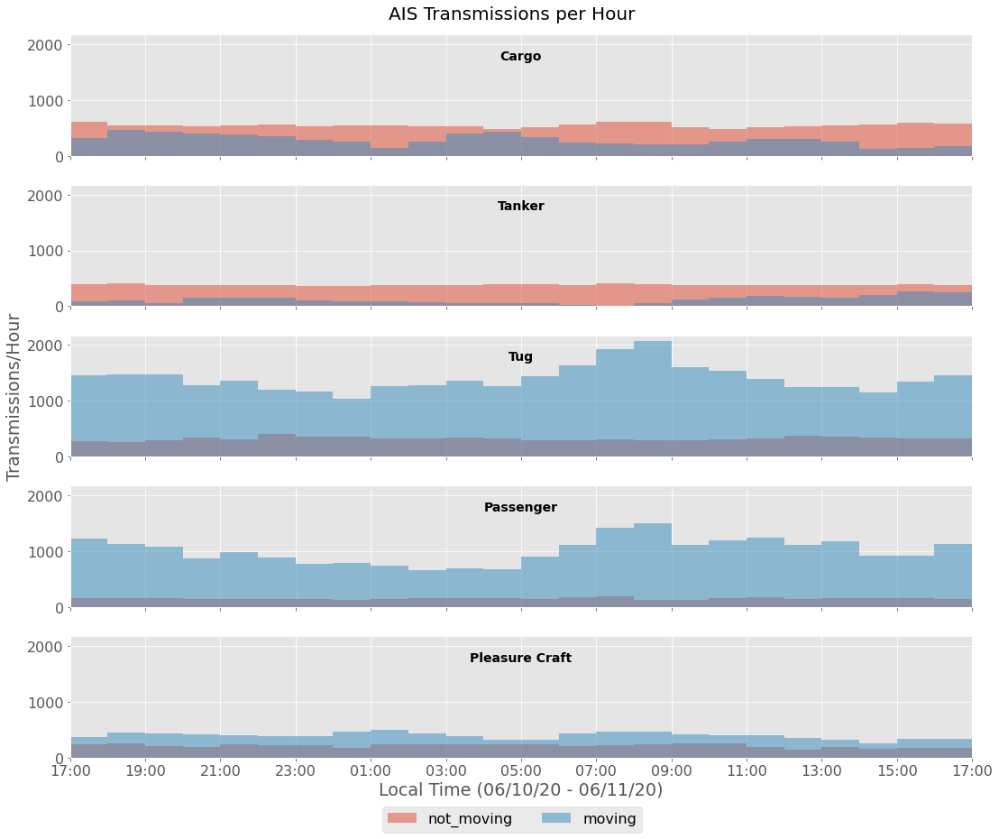

In [9]:
plot_by_hour(not_moving, moving, 'not_moving', 'moving', hour_bins)

We see that tankers and cargo ships exhibit similar behavior, with fewer transimission while moving than not moving. Recall that transmissions are also made more frequently while moving: from Q1, we know that tugs and passenger vessels are most numerous in our data, and since they are usually moving, the number of transmissions from these vessels is by far the greatest. 

We also see that tankers rarely move from midnight to 6am, while cargo ships might be more active in the early evening and late morning. There is also a sharp increase in the transmissions from passenger vessels iaround 5:00am, peaking around 7:00am and remaining elevated until tapering down in the evening. The same looks to be true for tugs as well.

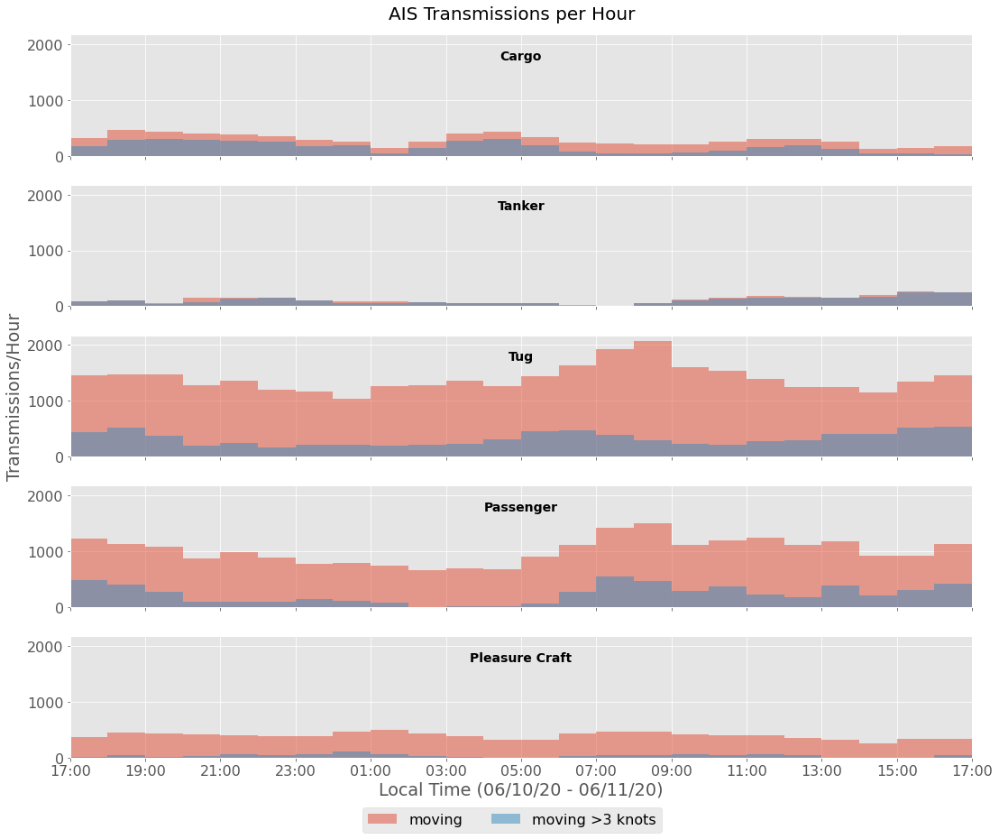

In [10]:
plot_by_hour(moving, moving_fast, 'moving', 'moving >3 knots', hour_bins)

If we instead look only at transmissions made while the vessel status is "Under way using engine" (aka moving), and compare to transmissions made when the vessel was moving quickly--at 3 knots or faster, see that when tankers are moving, they are almost always moing quickly. Cargo vessels also often also moving quickly. On the other hand, we see few transmissions in the dataset by pleasure craft moving at >3 knots.

Passenger vessels show a fairly high proportion of vessels moving quickly during the day, presumably while ferrys are operating, but show very little activity at night. The number of transmissions per hour for tugs are more constant, with a small peak in the morning around 6:00am and an extended peak between noon and 8pm. 

## 4. How are the SOG, Heading and COG related? How different is COG from Heading?

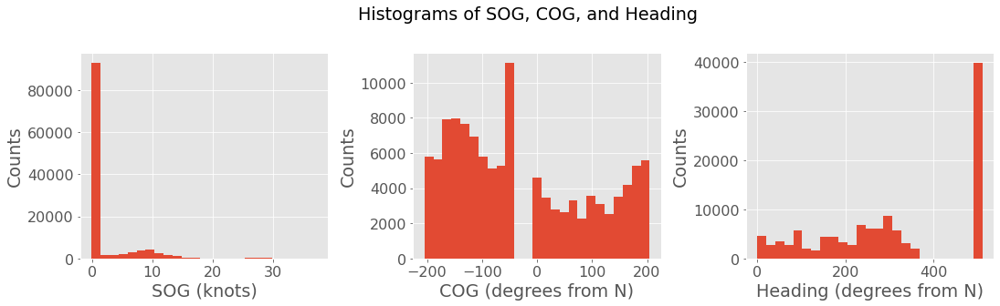

In [11]:
fig, axs = plt.subplots(1, 3, figsize=(15, 4))
ax1, ax2, ax3 = axs
fig.tight_layout(w_pad=3)
ax1.hist(data['SOG'], bins=25)
ax1.set_xlabel('SOG (knots)')
ax1.set_ylabel('Counts')
ax2.hist(data['COG'], bins=25)
ax2.set_xlabel('COG (degrees from N)')
ax2.set_ylabel('Counts')
ax3.hist(data['Heading'], bins=25)
ax3.set_xlabel('Heading (degrees from N)')
ax3.set_ylabel('Counts')

plt.suptitle('Histograms of SOG, COG, and Heading', y=1.1)
plt.show()

A few things of note:
* Almost all of the speeds are very close to zero.
* There seems to be a gap in COG between -50 and 0. The range of COG appears to go from -210 to -50 and then from 0 to 210
* Many of the transmissions have heading == 511

We might wonder how these three things are related. Plotting COG (course over ground), which should be similar to heading on x and y, and then an IHST transform* of SOG (speed over ground) on color, we see some definite trends.

\*Since there are some slightly negative values for SOG we use the inverse hyperbolic sine transform, which approaches a log transform for large values, and is defined at zero.

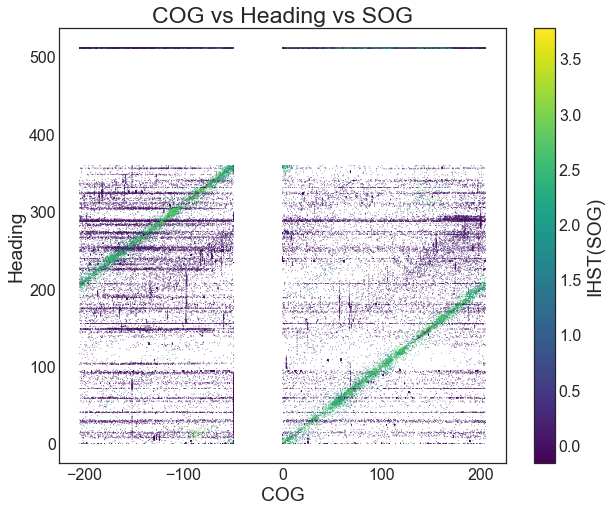

In [12]:
SOG_trans = np.log(data['SOG'] + (1+data['SOG']) ** (0.5)) # IHST transform
COG = data['COG']
heading = data['Heading']

plt.style.use('seaborn-white')
plt.rc('font', size=16)
ax, fig = plt.subplots(figsize=(10, 8))
cm = plt.cm.get_cmap('viridis')
sc = plt.scatter(COG, heading, c=SOG_trans, marker='.', s=.3, cmap=cm)
cbar = plt.colorbar(sc)
cbar.set_label('IHST(SOG)', labelpad=5, rotation=90)
plt.xlabel('COG')
plt.ylabel('Heading')
plt.title('COG vs Heading vs SOG')
plt.show()

We again see the large number of transmissions with a heading at 511--this is the default value and indicates that the heading is unavailable. We also notice the gap where there are no COG between -50 and 0. Additionally, when then SOG nonzero, there is almost a direct correlation between the heading and the COG. We can use this information to convert the COG angle to the number of degrees from North:

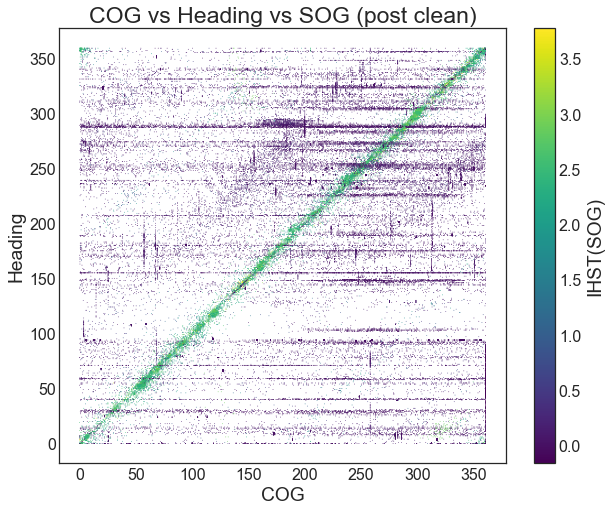

In [13]:
SOG_trans = np.log(data.query('Heading !=511')['SOG'] + (1+data.query('Heading !=511')['SOG']) ** (0.5)) # IHST transform
COG = [x if x>0 else (x%205 + 205) for x in data.query('Heading !=511')['COG']]
heading = data.query('Heading !=511')['Heading']

ax, fig = plt.subplots(figsize=(10, 8))
cm = plt.cm.get_cmap('viridis')
sc = plt.scatter(COG, heading, c=SOG_trans, marker='.', s=.3, cmap=cm)
cbar = plt.colorbar(sc)
cbar.set_label('IHST(SOG)', labelpad=5, rotation=90)
plt.xlabel('COG')
plt.ylabel('Heading')
plt.title('COG vs Heading vs SOG (post clean)')

plt.show()

After applying the correction to the COG and dropping transmissions with a heading of 511, we see that when ships are moving, the value of COG and Heading are almost exactly the same! This makes sense: when ships aren't moving, the current or wind could push the ship to move in a direction not along the "major axis" of the ship, but if the ship is moving quickly, then the net movement of the ship (i.e. the COG) will be closely aligned with the direction the ship is pointing (heading).

## 5. How do the movements and statuses of vessels depend on the type of vessel and its location in the Bay Area/LA?

For this question, I will be using an external data exploration tool (Virtualitics) to create maps of the locations of ships, and paste screenshots into the notebook. Apologies if the screenshots aren't rendering in their native resolution.

In [ ]:
bay_data.to_csv('bay.csv', index=False)
la_data.to_csv('LA.csv', index=False)
data.to_csv('data.csv', index=False)

### Bay Area

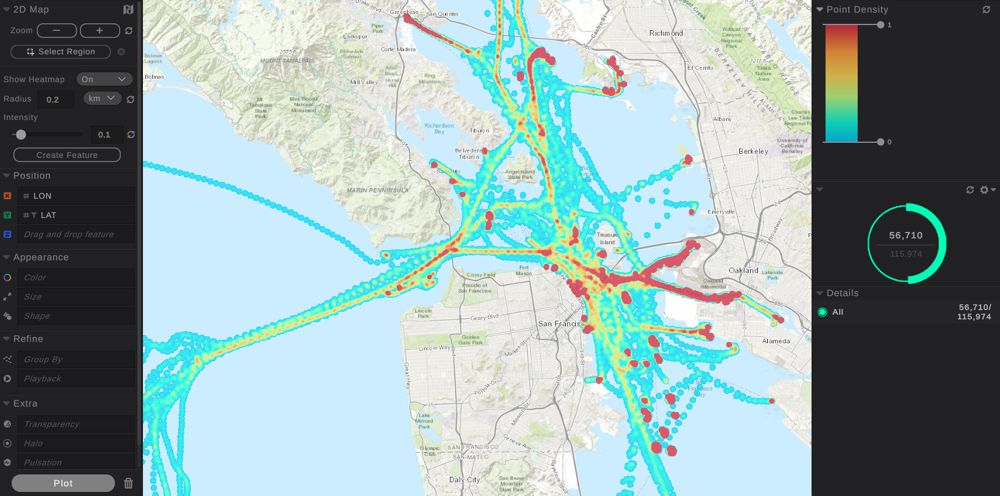

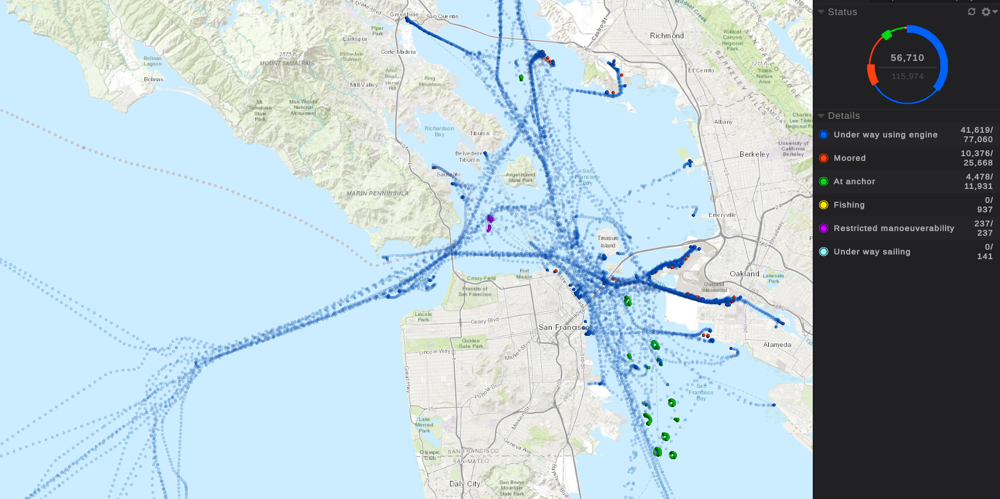

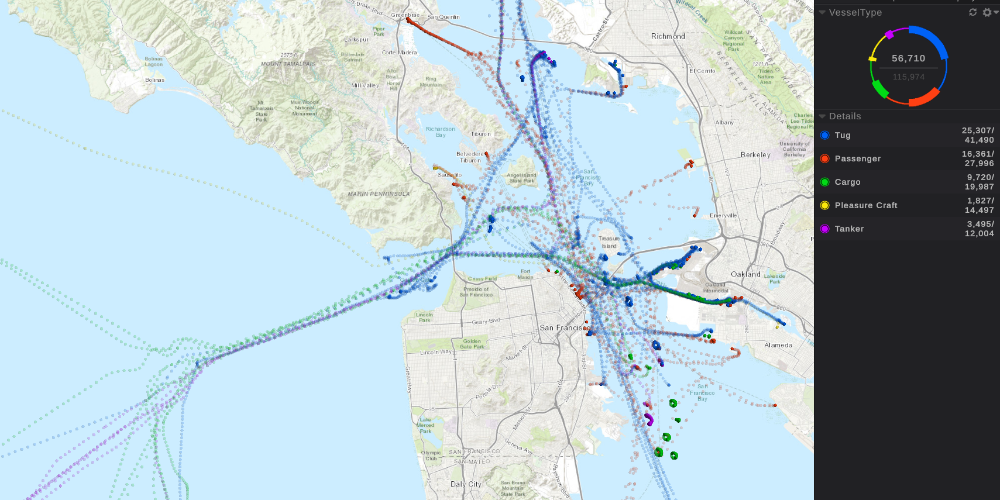

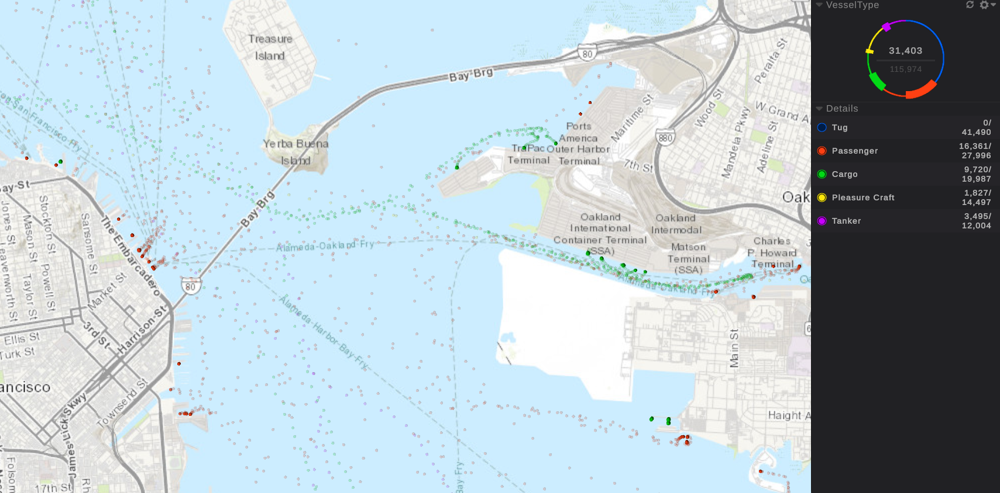

### Los Angeles

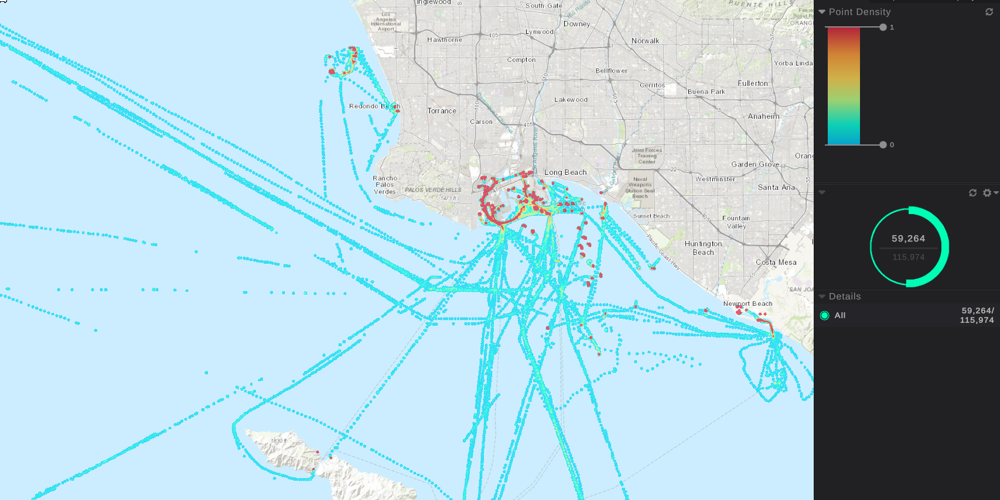

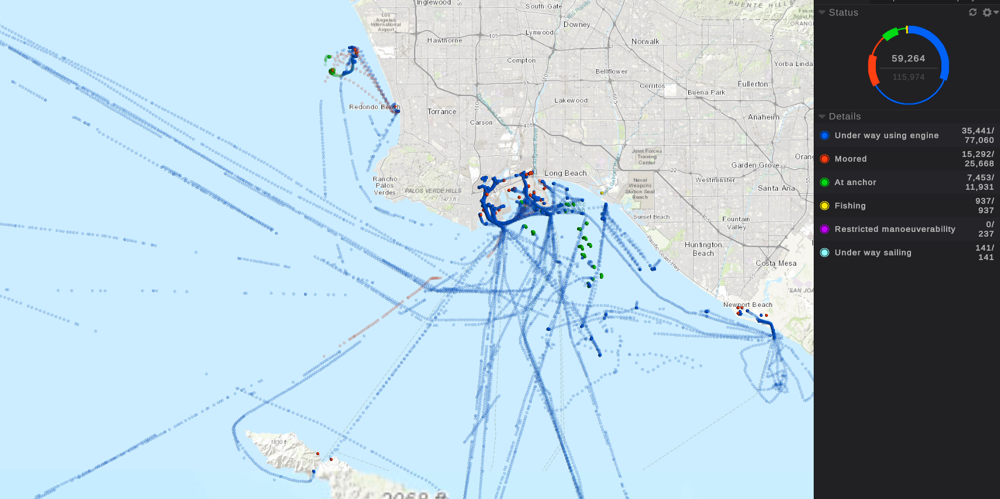

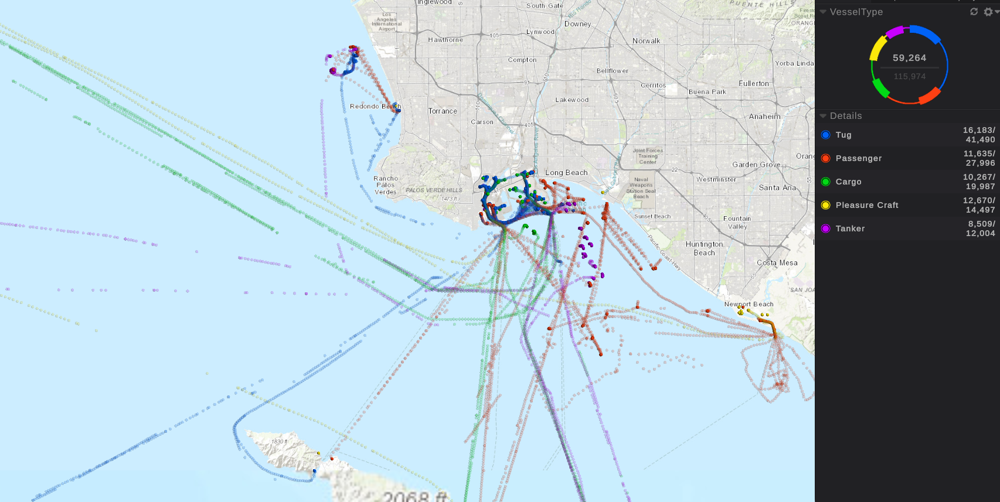

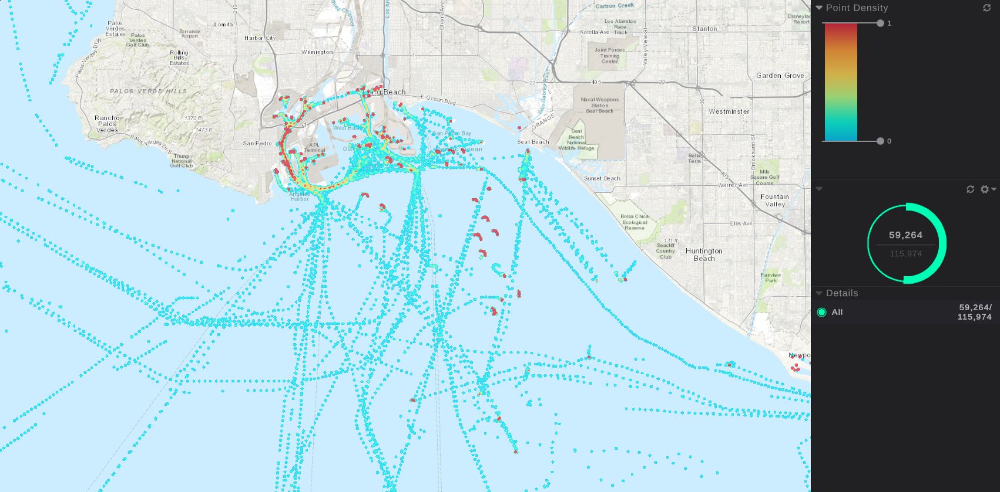